# Challenge Overview

Using the input data provided (scheduling_data.csv), please:
    
* Create a demand forecasting model to predict hourly order data for the week after the data set finishes (i.e. 1st week of July - 1-7th (Mon to Sunday)

* Backtest the data to determine the optimal level of staff per hour for a given level of orders 
    
* Use your demand forecasting model and optimal staffing data to recommend / create a staff schedule for the week 1-7th of July 

Opening hours to be used for schedule creation are 12 - 21:30 Sunday to Thursday and 12 - 22:00 Fri/Saturday

## Imports & Setup

In [272]:
import warnings
import xgboost
import pandas                  as pd
import numpy                   as np
import plotly.express          as px
import statsmodels.api         as sm
import pmdarima                as pm
import matplotlib.pyplot       as plt

from statsmodels.tsa.stattools import adfuller, acf, pacf
from statsmodels.tsa.api import ExponentialSmoothing
from statsmodels.tsa.arima_model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import MinMaxScaler, OneHotEncoder, LabelBinarizer
from sklearn.compose import ColumnTransformer
from datetime import timedelta
from numpy import asarray
from xgboost import XGBRegressor

pd.set_option("display.max_columns", None) 
pd.set_option("display.max_colwidth", None) 
pd.set_option("display.max_rows", None) 
pd.set_option("display.precision", 10)
pd.options.mode.chained_assignment = None 

warnings.filterwarnings("ignore")

## Initial Data Exploration

### Order Frequency (Interactive Graphs)

In [273]:
initial_df = pd.read_csv("scheduling_data.csv")
initial_df["datetime"] = initial_df["datetime"].apply(pd.to_datetime)
initial_df = initial_df.sort_values('datetime')
initial_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4368 entries, 0 to 4367
Data columns (total 5 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   datetime        4368 non-null   datetime64[ns]
 1   orders          4368 non-null   int64         
 2   management      4368 non-null   float64       
 3   back-of-house   4368 non-null   float64       
 4   front-of-house  4368 non-null   float64       
dtypes: datetime64[ns](1), float64(3), int64(1)
memory usage: 204.8 KB


In [274]:
order_df = initial_df.copy()#[["datetime", "orders"]]
order_df['hour'] = order_df['datetime'].dt.hour
order_df['day'] = order_df['datetime'].dt.day
order_df['week'] = order_df['datetime'].dt.isocalendar().week
order_df['month'] = order_df['datetime'].dt.month
order_df['year'] = order_df['datetime'].dt.year
order_df['day_name'] = order_df['datetime'].dt.day_name()
order_df['month_name'] = order_df['datetime'].dt.month_name()
order_df.head()

,datetime,orders,management,back-of-house,front-of-house,hour,day,week,month,year,day_name,month_name
0,2024-01-01 00:00:00,0,0.0,0.0,0.0,0,1,1,1,2024,Monday,January
1,2024-01-01 01:00:00,0,0.0,0.0,0.0,1,1,1,1,2024,Monday,January
2,2024-01-01 02:00:00,0,0.0,0.0,0.0,2,1,1,1,2024,Monday,January
3,2024-01-01 03:00:00,0,0.0,0.0,0.0,3,1,1,1,2024,Monday,January
4,2024-01-01 04:00:00,0,0.0,0.0,0.0,4,1,1,1,2024,Monday,January


In [275]:
hover_info=['datetime', 'day_name', 'month_name', 'hour', 'day', 'week', 'month', 'orders']

fig1 = px.line(order_df, x="datetime", y="orders", hover_data=hover_info, color='month_name', title='Order Quantity Over Lifetime')
fig1.show()
fig1.write_html("plots/demand_forecasting/line_order_quantity_lifetime.html")

daily_df = order_df[['datetime', 'orders']].set_index('datetime').resample('D').sum().reset_index()
daily_df.head()

fig1a = px.line(daily_df, x="datetime", y="orders", title='Order Quantity Daily Sample')
fig1a.show()
fig1a.write_html("plots/demand_forecasting/line_order_quantity_sample_daily.html")

monthly_df = order_df[['datetime', 'orders']].set_index('datetime').resample('M').sum().reset_index()
monthly_df.head()

fig1b = px.line(monthly_df, x="datetime", y="orders", title='Order Quantity Monthly Sample')
fig1b.show()
fig1a.write_html("plots/demand_forecasting/line_order_quantity_sample_monthly.html")

In [276]:
fig2 = px.bar(order_df, x="month_name", y="orders", hover_data=hover_info, color='day_name', title='Order Quantity Sum By Month')
fig2.show()
fig2.write_html("plots/demand_forecasting/bar_order_quantity_sum_by_month.html")

fig3 = px.bar(order_df, x="day_name", y="orders", hover_data=hover_info, color='month_name', title='Order Quantity Sum By Week Day')
fig3.show()
fig3.write_html("plots/demand_forecasting/bar_order_quantity_sum_by_weekday.html")

In [277]:
fig4 = px.bar(order_df, x="week", y="orders", hover_data=hover_info, color='day_name', title='Order Quantity Sum By Week')
fig4.show()
fig4.write_html("plots/demand_forecasting/bar_order_quantity_sum_by_week.html")

fig5 = px.bar(order_df, x="week", y="orders", barmode='group', hover_data=hover_info, color='day_name', title='Order Quantity Sum By Week (Grouped)')
fig5.show()
fig5.write_html("plots/demand_forecasting/bar_order_quantity_sum_by_week_grouped.html")

In [278]:
fig6 = px.bar(order_df, x="hour", y="orders", hover_data=hover_info, color='day_name', title='Order Quantity Sum By Hour')
fig6.show()
fig6.write_html("plots/demand_forecasting/bar_order_quantity_sum_by_hour.html")

fig7 = px.bar(order_df, x="hour", y="orders", barmode='group', hover_data=hover_info, color='day_name', title='Order Quantity Sum By Hour (Grouped)')
fig7.show()
fig7.write_html("plots/demand_forecasting/bar_order_quantity_sum_by_hour_grouped.html")

In [279]:
fig8 = px.density_heatmap(order_df, x="day_name", y="hour", z="orders", nbinsy=24, histfunc="sum", title='Hourly Orders By Day')
fig8['layout']['yaxis']['autorange'] = "reversed"
fig8.show()
fig8.write_html("plots/demand_forecasting/heatmap_order_sum_by_day.html")

fig9 = px.density_heatmap(order_df, x="month_name", y="hour", z="orders", nbinsy=24, histfunc="sum", title='Hourly Orders By Month')
fig9['layout']['yaxis']['autorange'] = "reversed"
fig9.show()
fig9.write_html("plots/demand_forecasting/heatmap_order_sum_by_month.html")

fig10 = px.density_heatmap(order_df, x="week", y="hour", z="orders", nbinsx=26, nbinsy=24, histfunc="sum", title='Hourly Orders By Week')
fig10['layout']['yaxis']['autorange'] = "reversed"
fig10.show()
fig10.write_html("plots/demand_forecasting/heatmap_order_sum_by_week.html")

In [280]:
# Note: These use sum and not a daily avg so can be skewed by day distribution 
# over a month (note Thursdays in February, Friday/Saturday in March)

fig11 = px.density_heatmap(order_df[order_df['week'] > 22], x="day_name", y="hour", z="orders", nbinsy=24, facet_col="week", histfunc="sum")
fig11['layout']['yaxis']['autorange'] = "reversed"
fig11.show()
fig11.write_html("plots/demand_forecasting/heatmap_order_sum_faceted.html")

## Investigate Stationarity

In [281]:
dickey_fuller = adfuller(order_df['orders'], autolag = 'AIC')
df_output = pd.Series(dickey_fuller[0:4], index=['Test Statistic', 'p-value', '#Lags Used', 'Number of Observations Used'])

for key, value in dickey_fuller[4].items():
    df_output['Critical Value (%s)' %key] = value

df_output

Test Statistic                   -6.8393114361
p-value                           0.0000000018
#Lags Used                       29.0000000000
Number of Observations Used    4338.0000000000
Critical Value (1%)              -3.4318583388
Critical Value (5%)              -2.8622065003
Critical Value (10%)             -2.5671247827
dtype: float64

Hourly graph is considered stationary but daily and monthly are not (p-value > 0.05)

Use hourly frequency, no differencing (diff in values at different time steps)

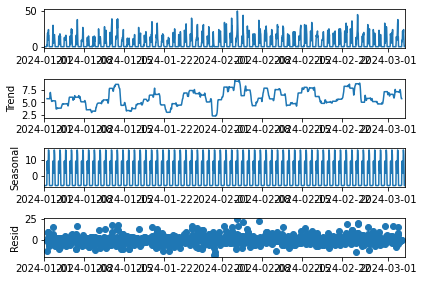

In [282]:
slice_df = order_df[order_df['week'] < 10][['datetime', 'orders']].set_index('datetime')
full_df = order_df[['datetime', 'orders']].set_index('datetime')

sm.tsa.seasonal_decompose(slice_df).plot().show()

## ACF & PACF

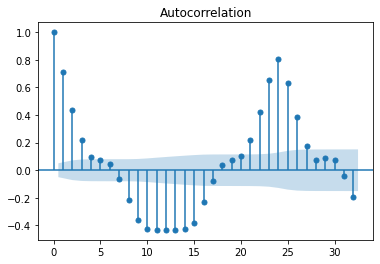

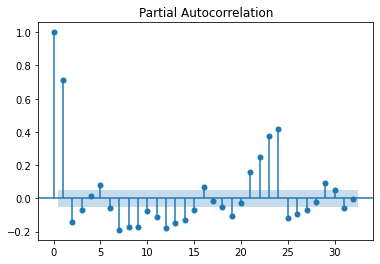

In [12]:
acf_plot = plot_acf(slice_df)
pacf_plot = plot_pacf(slice_df)

## Split Data

In [283]:
train_slice = order_df[(order_df['week'] >= 19) & (order_df['week'] < 21)][['datetime', 'orders']]
train = order_df[order_df['week'] < 21]
train_indexed = train[['datetime', 'orders']].set_index('datetime')

test = order_df[(order_df['week'] >= 21) & (order_df['week'] < 24)]
val = order_df[order_df['week'] >= 24]


x_train = train['datetime']
y_train = train['orders']

x_test = test['datetime']
y_test = test['orders']

x_val = val['datetime']
y_val = val['orders']

x_slice = train_slice['datetime']
y_slice = train_slice['orders']

train_slice['predictions'] = np.nan

## Baseline Algorithm

Holt Winters exponential smoothing, with capping

RMSE as metric, MAPE discarded due to 0s in data

In [284]:
model = ExponentialSmoothing(y_train, seasonal_periods=24, trend='add', seasonal='add').fit()
preds = model.forecast(len(y_test))

In [287]:
results_df_hw = test.copy()[['datetime', 'orders']]
results_df_hw['predictions'] = list(preds)

rms = mean_squared_error(results_df_hw['orders'], results_df_hw['predictions'], squared=False)
print('Root Mean Squared Error:', rms)

graph_results_df_hw = pd.concat([train_slice, results_df_hw], ignore_index = True)
fig12 = px.line(graph_results_df_hw, x="datetime", y=["orders", "predictions"], title='TEST Exponential Smoothing: Actual vs Predictions<br><sup>RMSE: 5.08</sup>')
fig12.show()
fig12.write_html("plots/demand_forecasting/m1_exponential_smoothing/test_exponential_smoothing.html")

Root Mean Squared Error: 5.076475534246782


In [288]:
results_df_hwc = results_df_hw.copy()
results_df_hwc['predictions'] = np.where(results_df_hwc['predictions'] < 0, 0, results_df_hwc['predictions'])

rms = mean_squared_error(results_df_hwc['orders'], results_df_hwc['predictions'], squared=False)
print('Root Mean Squared Error:', rms)

graph_results_df_hwc = pd.concat([train_slice, results_df_hwc], ignore_index = True)
fig13 = px.line(graph_results_df_hwc, x="datetime", y=["orders", "predictions"], title='TEST Exponential Smoothing Capped: Actual vs Predictions<br><sup>RMSE: 3.80</sup>')
fig13.show()
fig13.write_html("plots/demand_forecasting/m1_exponential_smoothing/test_exponential_smoothing_capped.html")

Root Mean Squared Error: 3.80838628723163


## Seasonal ARIMA

In [76]:
s_model = pm.auto_arima(train[['datetime', 'orders']].set_index('datetime'), start_p=0, start_q=0,
                         test='adf',
                         max_p=6, max_q=6, m=24,
                         start_P=0, seasonal=True,
                         d=0, D=None, trace=True,
                         error_action='ignore',  
                         suppress_warnings=True, 
                         stepwise=True)

s_model.summary()

Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,1)[24] intercept   : AIC=22326.544, Time=1.77 sec
 ARIMA(0,0,0)(0,0,0)[24] intercept   : AIC=24166.089, Time=0.05 sec
 ARIMA(1,0,0)(1,0,0)[24] intercept   : AIC=20034.328, Time=2.45 sec
 ARIMA(0,0,1)(0,0,1)[24] intercept   : AIC=21291.997, Time=3.05 sec
 ARIMA(0,0,0)(0,0,0)[24]             : AIC=25377.528, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[24] intercept   : AIC=21808.509, Time=0.14 sec
 ARIMA(1,0,0)(2,0,0)[24] intercept   : AIC=inf, Time=12.43 sec
 ARIMA(1,0,0)(1,0,1)[24] intercept   : AIC=inf, Time=8.21 sec
 ARIMA(1,0,0)(0,0,1)[24] intercept   : AIC=20934.296, Time=2.59 sec
 ARIMA(1,0,0)(2,0,1)[24] intercept   : AIC=inf, Time=46.36 sec
 ARIMA(0,0,0)(1,0,0)[24] intercept   : AIC=inf, Time=2.67 sec
 ARIMA(2,0,0)(1,0,0)[24] intercept   : AIC=20034.536, Time=4.02 sec
 ARIMA(1,0,1)(1,0,0)[24] intercept   : AIC=20034.378, Time=3.86 sec
 ARIMA(0,0,1)(1,0,0)[24] intercept   : AIC=20112.358, Time=3.23 sec
 ARIMA(2,0,1)(1,0,0)[24] in

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                                  y   No. Observations:                 3360
Model:             SARIMAX(1, 0, 0)x(1, 0, 0, 24)   Log Likelihood              -10013.164
Date:                            Thu, 15 Aug 2024   AIC                          20034.328
Time:                                    07:13:19   BIC                          20058.807
Sample:                                         0   HQIC                         20043.083
                                           - 3360                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      1.0017      0.149      6.731      0.000       0.710       1.293
ar.L1          0.3944      0.011     37.498      0.000       0.374       0.415
ar.S.L24       0.7131      0.009     76.370      0.000       0.695       0.731
sigma2        22.5835      0.343     65.922      0.000      21.912      23.255
===================================================================================
Ljung-Box (L1) (Q):                   0.28   Jarque-Bera (JB):              5490.27
Prob(Q):                              0.60   Prob(JB):                         0.00
Heteroskedasticity (H):               0.88   Skew:                             1.22
Prob(H) (two-sided):                  0.04   Kurtosis:                         8.77
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [77]:
# Prev runs for consideration: 
# (pdq)x(PDQm) = (1, 0, 1)x(2, 0, 0, 24)
# (pdq)x(PDQm) = (1, 0, 0)x(1, 0, 0, 24)

In [78]:
preds = s_model.predict(n_periods=len(y_test), return_conf_int=False)

results_df_sarima = test.copy()[['datetime', 'orders']]
results_df_sarima['predictions'] = list(preds)

rms = mean_squared_error(results_df_sarima['orders'], results_df_sarima['predictions'], squared=False)
print('Root Mean Squared Error:', rms)

graph_results_df_sarima = pd.concat([train_slice, results_df_sarima], ignore_index = True)
fig14 = px.line(graph_results_df_sarima, x="datetime", y=["orders", "predictions"], title='Step Auto ARIMA: Actual vs Predictions')
fig14.show()


Root Mean Squared Error: 7.0002246323350406


In [85]:
# Set based on findings of Auto ARIMA & ACF/PACF plots:

# 8.40 - Auto rec 
# pdq = (1,0,0)
# PDQm = (1, 0, 0, 24)

# 7.69 - Auto rec based on slice 
# pdq = (1,0,1)
# PDQm = (2, 0, 0, 24)

# # 7.71 - ACF/PACF analysis
# pdq = (1,0,6)
# PDQm = (2, 0, 0, 24)

# 3.26 
pdq = (1,0,6)
PDQm = (2, 0, 1, 24)

# 3.34 
# pdq = (1,0,6)
# PDQm = (2, 0, 6, 24)


smodel = SARIMAX(train[['datetime', 'orders']].set_index('datetime'), freq='h', order=pdq, seasonal_order=PDQm).fit()
smodel.summary()


<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                       
============================================================================================
Dep. Variable:                               orders   No. Observations:                 3360
Model:             SARIMAX(1, 0, 6)x(2, 0, [1], 24)   Log Likelihood               -9465.868
Date:                              Thu, 15 Aug 2024   AIC                          18953.736
Time:                                      09:28:00   BIC                          19021.052
Sample:                                  01-01-2024   HQIC                         18977.810
                                       - 05-19-2024                                         
Covariance Type:                                opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.9344      0.064     14.512      0.000       0.808       1.061
ma.L1         -0.5698      0.066     -8.679      0.000      -0.698      -0.441
ma.L2         -0.1773      0.029     -6.060      0.000      -0.235      -0.120
ma.L3         -0.0629      0.015     -4.324      0.000      -0.091      -0.034
ma.L4         -0.0230      0.014     -1.686      0.092      -0.050       0.004
ma.L5         -0.0357      0.018     -2.014      0.044      -0.070      -0.001
ma.L6         -0.0021      0.016     -0.129      0.897      -0.034       0.030
ar.S.L24       1.1757      0.011    107.718      0.000       1.154       1.197
ar.S.L48      -0.1760      0.011    -16.150      0.000      -0.197      -0.155
ma.S.L24      -0.9671      0.005   -204.088      0.000      -0.976      -0.958
sigma2        15.9686      0.203     78.735      0.000      15.571      16.366
===================================================================================
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):              5916.85
Prob(Q):                              0.95   Prob(JB):                         0.00
Heteroskedasticity (H):               0.84   Skew:                             0.98
Prob(H) (two-sided):                  0.00   Kurtosis:                         9.20
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [80]:
preds = smodel.forecast(steps=len(y_test))

results_sarima = test.copy()[['datetime', 'orders']]
results_sarima['predictions'] = list(preds)

rms = mean_squared_error(results_sarima['orders'], results_sarima['predictions'], squared=False)
print('Root Mean Squared Error:', rms)

graph_results_sarima = pd.concat([train_slice, results_sarima], ignore_index = True)
fig15 = px.line(graph_results_sarima, x="datetime", y=["orders", "predictions"], title='Step SARIMAX: Actual vs Predictions')
fig15.show()


Root Mean Squared Error: 7.711905495811714


### Rolling Forecast Seasonal ARIMA

In [81]:
pdq = (1,0,6)
PDQm = (2, 0, 1, 24)

rolling_predictions = []
history = train_indexed.copy()

for ts in test['datetime'].dt.date.drop_duplicates():
    print(ts)
    train_i = history[ts-timedelta(weeks=5):]
    model_i = SARIMAX(train_i, order=pdq, seasonal_order=PDQm).fit()
    
    preds = model_i.forecast(steps=24)
    rolling_predictions.extend(preds.values.tolist())

    
    new_history = pd.Series.to_frame(preds) \
                            .reset_index() \
                            .rename(columns={'index': 'datetime', 'predicted_mean': 'orders'}) \
                            .set_index('datetime')
    
    history = pd.concat([history,new_history])
 

2024-05-20
2024-05-21
2024-05-22
2024-05-23
2024-05-24
2024-05-25
2024-05-26
2024-05-27
2024-05-28
2024-05-29
2024-05-30
2024-05-31
2024-06-01
2024-06-02
2024-06-03
2024-06-04
2024-06-05
2024-06-06
2024-06-07
2024-06-08
2024-06-09


In [83]:
results_rolling = test.copy()[['datetime', 'orders']]
results_rolling['predictions'] = rolling_predictions

rms = mean_squared_error(results_rolling['orders'], results_rolling['predictions'], squared=False)
print('Root Mean Squared Error:', rms)

graph_results_rolling = pd.concat([train_slice, results_rolling], ignore_index = True)
fig16 = px.line(graph_results_rolling, x="datetime", y=["orders", "predictions"], title='Rolling SARIMAX w/Short Window: Actual vs Predictions')
fig16.show()

Root Mean Squared Error: 3.305960207453774


## XGBoost

In [180]:
train_eng = train[['datetime', 'hour', 'day_name', 'orders']]

train_eng["order_1"] = train_eng["orders"].shift(1, fill_value=0)
train_eng["order_2"] = train_eng["orders"].shift(2, fill_value=0)
train_eng["order_3"] = train_eng["orders"].shift(3, fill_value=0)

scaler = MinMaxScaler()
train_eng[['s_orders', 's_order_1', 's_order_2', 's_order_3']] = scaler.fit_transform(train_eng[['orders', 'order_1', 'order_2', 'order_3']])


hours_encoder = LabelBinarizer()
hours_encoder.fit(train_eng['hour'])
transformed = hours_encoder.transform(train_eng['hour'])
ohe_df = pd.DataFrame(transformed)
train_eng = pd.concat([train_eng, ohe_df.set_index(train_eng.index)], axis=1).drop('hour', axis=1)

days_encoder = LabelBinarizer()
days_encoder.fit(train_eng['day_name'])
transformed = days_encoder.transform(train_eng['day_name'])
ohe_df = pd.DataFrame(transformed).rename(columns={0: 'd0', 1: 'd1', 2: 'd2', 3: 'd3', 4: 'd4', 5: 'd5', 6: 'd6'}) 
train_eng = pd.concat([train_eng, ohe_df.set_index(train_eng.index)], axis=1).drop('day_name', axis=1)
    
train_eng = train_eng.reset_index()    
# train_eng.head()

,index,datetime,orders,order_1,order_2,order_3,s_orders,s_order_1,s_order_2,s_order_3,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,d0,d1,d2,d3,d4,d5,d6
0,0,2024-01-01 00:00:00,0,0,0,0,0.0,0.0,0.0,0.0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
1,1,2024-01-01 01:00:00,0,0,0,0,0.0,0.0,0.0,0.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
2,2,2024-01-01 02:00:00,0,0,0,0,0.0,0.0,0.0,0.0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
3,3,2024-01-01 03:00:00,0,0,0,0,0.0,0.0,0.0,0.0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
4,4,2024-01-01 04:00:00,0,0,0,0,0.0,0.0,0.0,0.0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0


In [182]:
def apply_preprocess(df, mm_scaler, day_encoder, hour_encoder):

    df_eng = df[['datetime', 'hour', 'day_name', 'orders']]

    df_eng["order_1"] = df_eng["orders"].shift(1, fill_value=0)
    df_eng["order_2"] = df_eng["orders"].shift(2, fill_value=0)
    df_eng["order_3"] = df_eng["orders"].shift(3, fill_value=0)

    df_eng[['s_orders', 's_order_1', 's_order_2', 's_order_3']] = scaler.transform(df_eng[['orders', 'order_1', 'order_2', 'order_3']])

    transformed = hour_encoder.transform(df_eng['hour'])
    ohe_df = pd.DataFrame(transformed)
    df_eng = pd.concat([df_eng, ohe_df.set_index(df_eng.index)], axis=1).drop('hour', axis=1)

    transformed = day_encoder.transform(df_eng['day_name'])
    ohe_df = pd.DataFrame(transformed).rename(columns={0: 'd0', 1: 'd1', 2: 'd2', 3: 'd3', 4: 'd4', 5: 'd5', 6: 'd6'}) 
    df_eng = pd.concat([df_eng, ohe_df.set_index(df_eng.index)], axis=1).drop('day_name', axis=1)

    return df_eng.reset_index()
    
    
test_eng = apply_preprocess(test, scaler, days_encoder, hours_encoder)
val_eng = apply_preprocess(val, scaler, days_encoder, hours_encoder)

len(test_eng)
# test_eng.head(5)

,index,datetime,orders,order_1,order_2,order_3,s_orders,s_order_1,s_order_2,s_order_3,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,d0,d1,d2,d3,d4,d5,d6
0,3360,2024-05-20 00:00:00,0,0,0,0,0.0,0.0,0.0,0.0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
1,3361,2024-05-20 01:00:00,0,0,0,0,0.0,0.0,0.0,0.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
2,3362,2024-05-20 02:00:00,0,0,0,0,0.0,0.0,0.0,0.0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
3,3363,2024-05-20 03:00:00,0,0,0,0,0.0,0.0,0.0,0.0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
4,3364,2024-05-20 04:00:00,0,0,0,0,0.0,0.0,0.0,0.0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0


In [197]:
x_cols = train_eng.columns[7:]
y_col = train_eng.columns[2]
x_cols
y_col

Index([    'index',  'datetime',    'orders',   'order_1',   'order_2',
         'order_3',  's_orders', 's_order_1', 's_order_2', 's_order_3',
                 0,           1,           2,           3,           4,
                 5,           6,           7,           8,           9,
                10,          11,          12,          13,          14,
                15,          16,          17,          18,          19,
                20,          21,          22,          23,        'd0',
              'd1',        'd2',        'd3',        'd4',        'd5',
              'd6'],
      dtype='object')

In [242]:
xgb_preds = []
history = apply_preprocess(train.copy(), scaler, days_encoder, hours_encoder).set_index('datetime').drop('index', axis=1).drop('s_orders', axis=1)

for ts in test['datetime']:
    
    print(ts)
    train_i = history.copy()[ts-timedelta(weeks=18):]
    train_ix, train_iy = train_i[x_cols], train_i[y_col]
    model_i = XGBRegressor(objective='reg:squarederror', n_estimators=1000).fit(train_ix, train_iy)
    
    
    # Construct next sample
    
    new_date_data = {'datetime' : pd.to_datetime(ts), 'order_1' : list(train_i[-1:]['orders'])[0], 'order_2' : list(train_i[-1:]['order_1'])[0], 'order_3' : list(train_i[-1:]['order_2'])[0]}
    new_date = pd.DataFrame(new_date_data, index=[0])
    new_date[['drop_col', 's_order_1', 's_order_2', 's_order_3']] = scaler.transform(new_date[['order_1', 'order_1', 'order_2', 'order_3']])
    new_date = new_date.drop('drop_col', axis=1)
    
    new_date['hour'] = new_date['datetime'].dt.hour
    new_date['day_name'] = new_date['datetime'].dt.day_name()
    
    transformed = hours_encoder.transform(new_date['hour'])
    ohe_df = pd.DataFrame(transformed)
    new_date = pd.concat([new_date, ohe_df.set_index(new_date.index)], axis=1).drop('hour', axis=1)

    transformed = days_encoder.transform(new_date['day_name'])
    ohe_df = pd.DataFrame(transformed).rename(columns={0: 'd0', 1: 'd1', 2: 'd2', 3: 'd3', 4: 'd4', 5: 'd5', 6: 'd6'}) 
    new_date = pd.concat([new_date, ohe_df.set_index(new_date.index)], axis=1).drop('day_name', axis=1)
    
    
    # Make prediction & add to history for next loop
    
    pred = model_i.predict(new_date[x_cols])
    xgb_preds.extend(pred)
    
    new_history_data = {'datetime': pd.to_datetime(ts), 'orders' : pred}
    new_history = pd.DataFrame(new_history_data, index=[0])
    new_history = pd.concat([new_history, new_date.set_index(new_history.index)], axis=1) 
    new_history = new_history.loc[:,~new_history.columns.duplicated()].set_index('datetime')

    history = pd.concat([history.copy(), new_history], axis=0)
    

2024-05-20 00:00:00
3361
3024
2024-05-20 01:00:00
3362
3024
2024-05-20 02:00:00
3363
3024
2024-05-20 03:00:00
3364
3024
2024-05-20 04:00:00
3365
3024
2024-05-20 05:00:00
3366
3024
2024-05-20 06:00:00
3367
3024
2024-05-20 07:00:00
3368
3024
2024-05-20 08:00:00
3369
3024
2024-05-20 09:00:00
3370
3024
2024-05-20 10:00:00
3371
3024
2024-05-20 11:00:00
3372
3024
2024-05-20 12:00:00
3373
3024
2024-05-20 13:00:00
3374
3024
2024-05-20 14:00:00
3375
3024
2024-05-20 15:00:00
3376
3024
2024-05-20 16:00:00
3377
3024
2024-05-20 17:00:00
3378
3024
2024-05-20 18:00:00
3379
3024
2024-05-20 19:00:00
3380
3024
2024-05-20 20:00:00
3381
3024
2024-05-20 21:00:00
3382
3024
2024-05-20 22:00:00
3383
3024
2024-05-20 23:00:00
3384
3024
2024-05-21 00:00:00
3385
3024
2024-05-21 01:00:00
3386
3024
2024-05-21 02:00:00
3387
3024
2024-05-21 03:00:00
3388
3024
2024-05-21 04:00:00
3389
3024
2024-05-21 05:00:00
3390
3024
2024-05-21 06:00:00
3391
3024
2024-05-21 07:00:00
3392
3024
2024-05-21 08:00:00
3393
3024
2024-05-21

3634
3024
2024-05-31 10:00:00
3635
3024
2024-05-31 11:00:00
3636
3024
2024-05-31 12:00:00
3637
3024
2024-05-31 13:00:00
3638
3024
2024-05-31 14:00:00
3639
3024
2024-05-31 15:00:00
3640
3024
2024-05-31 16:00:00
3641
3024
2024-05-31 17:00:00
3642
3024
2024-05-31 18:00:00
3643
3024
2024-05-31 19:00:00
3644
3024
2024-05-31 20:00:00
3645
3024
2024-05-31 21:00:00
3646
3024
2024-05-31 22:00:00
3647
3024
2024-05-31 23:00:00
3648
3024
2024-06-01 00:00:00
3649
3024
2024-06-01 01:00:00
3650
3024
2024-06-01 02:00:00
3651
3024
2024-06-01 03:00:00
3652
3024
2024-06-01 04:00:00
3653
3024
2024-06-01 05:00:00
3654
3024
2024-06-01 06:00:00
3655
3024
2024-06-01 07:00:00
3656
3024
2024-06-01 08:00:00
3657
3024
2024-06-01 09:00:00
3658
3024
2024-06-01 10:00:00
3659
3024
2024-06-01 11:00:00
3660
3024
2024-06-01 12:00:00
3661
3024
2024-06-01 13:00:00
3662
3024
2024-06-01 14:00:00
3663
3024
2024-06-01 15:00:00
3664
3024
2024-06-01 16:00:00
3665
3024
2024-06-01 17:00:00
3666
3024
2024-06-01 18:00:00
3667
3024


In [253]:
results_x = test.copy()[['datetime', 'orders']]
results_x['predictions'] = xgb_preds

rms = mean_squared_error(results_x['orders'], results_x['predictions'], squared=False)
print('Root Mean Squared Error:', rms)

graph_results_x = pd.concat([train_slice, results_x], ignore_index = True)
fig18 = px.line(graph_results_x, x="datetime", y=["orders", "predictions"], title='Test XGBoost: Actual vs Predictions<br><sup>RMSE: 3.44</sup>')
fig18.show()
fig18.write_html("plots/demand_forecasting/m3_xgboost/test_xgboost.html")

Root Mean Squared Error: 3.4398953658321028


In [255]:
results_x = test.copy()[['datetime', 'orders']]
results_x['predictions'] = xgb_preds
results_x['hour'] = results_x["datetime"].dt.hour
results_x['predictions_capped'] = results_x['predictions']

results_x.loc[results_x['hour'] < 12, 'predictions_capped'] = 0
results_x.loc[results_x['hour'] >= 22, 'predictions_capped'] = 0

rms = mean_squared_error(results_x['orders'], results_x['predictions_capped'], squared=False)
print('Root Mean Squared Error:', rms)

graph_results_x = pd.concat([train_slice, results_x], ignore_index = True)
fig19 = px.line(graph_results_x, x="datetime", y=["orders", "predictions_capped"], title='Test XGBoost Capped: Actual vs Predictions<br><sup>RMSE: 3.43</sup>')
fig19.show()
fig19.write_html("plots/demand_forecasting/m3_xgboost/test_xgboost_capped.html")

Root Mean Squared Error: 3.431445697616376


# Validation Sets

### Testing our chosen SARIMA model on validation data

In [86]:
pdq = (1,0,6)
PDQm = (2, 0, 1, 24)

new_train = pd.concat([train, test]) # Bring the train timeframe up to the validation start date

smodel = SARIMAX(new_train[['datetime', 'orders']].set_index('datetime'), freq='h', order=pdq, seasonal_order=PDQm).fit()
smodel.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                       
============================================================================================
Dep. Variable:                               orders   No. Observations:                 3864
Model:             SARIMAX(1, 0, 6)x(2, 0, [1], 24)   Log Likelihood              -10780.355
Date:                              Thu, 15 Aug 2024   AIC                          21582.710
Time:                                      09:31:15   BIC                          21651.564
Sample:                                  01-01-2024   HQIC                         21607.160
                                       - 06-09-2024                                         
Covariance Type:                                opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.9484      0.039     24.400      0.000       0.872       1.025
ma.L1         -0.5915      0.041    -14.591      0.000      -0.671      -0.512
ma.L2         -0.1785      0.020     -9.153      0.000      -0.217      -0.140
ma.L3         -0.0684      0.014     -4.861      0.000      -0.096      -0.041
ma.L4         -0.0165      0.008     -2.083      0.037      -0.032      -0.001
ma.L5         -0.0341      0.016     -2.175      0.030      -0.065      -0.003
ma.L6         -0.0040      0.015     -0.267      0.790      -0.033       0.025
ar.S.L24       1.1761      0.010    119.472      0.000       1.157       1.195
ar.S.L48      -0.1764      0.010    -17.982      0.000      -0.196      -0.157
ma.S.L24      -0.9684      0.004   -248.749      0.000      -0.976      -0.961
sigma2        15.2183      0.179     84.946      0.000      14.867      15.569
===================================================================================
Ljung-Box (L1) (Q):                   0.01   Jarque-Bera (JB):              6944.38
Prob(Q):                              0.94   Prob(JB):                         0.00
Heteroskedasticity (H):               0.68   Skew:                             0.98
Prob(H) (two-sided):                  0.00   Kurtosis:                         9.27
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [297]:
preds = smodel.forecast(steps=len(y_val))

results_sarima = val.copy()[['datetime', 'orders']]
results_sarima['predictions'] = list(preds)

rms = mean_squared_error(results_sarima['orders'], results_sarima['predictions'], squared=False)
print('Root Mean Squared Error:', rms)

graph_slice = order_df[(order_df['week'] >= 21) & (order_df['week'] < 24)][['datetime', 'orders']]
graph_results_sarima = pd.concat([graph_slice, results_sarima], ignore_index = True)
fig17 = px.line(graph_results_sarima, x="datetime", y=["orders", "predictions"], title='Val SARIMAX: Actual vs Predictions<br><sup>RMSE: 3.29</sup>')
fig17.show()
fig17.write_html("plots/demand_forecasting/m2_sarimax/val_sarimax.html")

Root Mean Squared Error: 3.2282395228294813


### Testing our chosen XGBoost model settings on validation data

In [256]:
new_train = pd.concat([train, test]) # Bring the train timeframe up to the validation start date

In [257]:
xgb_preds = []
history = apply_preprocess(new_train.copy(), scaler, days_encoder, hours_encoder).set_index('datetime').drop('index', axis=1).drop('s_orders', axis=1)

for ts in val['datetime']:
    
    print(ts)
    train_i = history.copy()[ts-timedelta(weeks=18):]
    train_ix, train_iy = train_i[x_cols], train_i[y_col]
    model_i = XGBRegressor(objective='reg:squarederror', n_estimators=1000).fit(train_ix, train_iy)
    
    
    # Construct next sample
    
    new_date_data = {'datetime' : pd.to_datetime(ts), 'order_1' : list(train_i[-1:]['orders'])[0], 'order_2' : list(train_i[-1:]['order_1'])[0], 'order_3' : list(train_i[-1:]['order_2'])[0]}
    new_date = pd.DataFrame(new_date_data, index=[0])
    new_date[['drop_col', 's_order_1', 's_order_2', 's_order_3']] = scaler.transform(new_date[['order_1', 'order_1', 'order_2', 'order_3']])
    new_date = new_date.drop('drop_col', axis=1)
    
    new_date['hour'] = new_date['datetime'].dt.hour
    new_date['day_name'] = new_date['datetime'].dt.day_name()
    
    transformed = hours_encoder.transform(new_date['hour'])
    ohe_df = pd.DataFrame(transformed)
    new_date = pd.concat([new_date, ohe_df.set_index(new_date.index)], axis=1).drop('hour', axis=1)

    transformed = days_encoder.transform(new_date['day_name'])
    ohe_df = pd.DataFrame(transformed).rename(columns={0: 'd0', 1: 'd1', 2: 'd2', 3: 'd3', 4: 'd4', 5: 'd5', 6: 'd6'}) 
    new_date = pd.concat([new_date, ohe_df.set_index(new_date.index)], axis=1).drop('day_name', axis=1)
    
    
    # Make prediction & add to history for next loop
    
    pred = model_i.predict(new_date[x_cols])
    xgb_preds.extend(pred)
    
    new_history_data = {'datetime': pd.to_datetime(ts), 'orders' : pred}
    new_history = pd.DataFrame(new_history_data, index=[0])
    new_history = pd.concat([new_history, new_date.set_index(new_history.index)], axis=1) 
    new_history = new_history.loc[:,~new_history.columns.duplicated()].set_index('datetime')

    history = pd.concat([history.copy(), new_history], axis=0)
    

2024-06-10 00:00:00
2024-06-10 01:00:00
2024-06-10 02:00:00
2024-06-10 03:00:00
2024-06-10 04:00:00
2024-06-10 05:00:00
2024-06-10 06:00:00
2024-06-10 07:00:00
2024-06-10 08:00:00
2024-06-10 09:00:00
2024-06-10 10:00:00
2024-06-10 11:00:00
2024-06-10 12:00:00
2024-06-10 13:00:00
2024-06-10 14:00:00
2024-06-10 15:00:00
2024-06-10 16:00:00
2024-06-10 17:00:00
2024-06-10 18:00:00
2024-06-10 19:00:00
2024-06-10 20:00:00
2024-06-10 21:00:00
2024-06-10 22:00:00
2024-06-10 23:00:00
2024-06-11 00:00:00
2024-06-11 01:00:00
2024-06-11 02:00:00
2024-06-11 03:00:00
2024-06-11 04:00:00
2024-06-11 05:00:00
2024-06-11 06:00:00
2024-06-11 07:00:00
2024-06-11 08:00:00
2024-06-11 09:00:00
2024-06-11 10:00:00
2024-06-11 11:00:00
2024-06-11 12:00:00
2024-06-11 13:00:00
2024-06-11 14:00:00
2024-06-11 15:00:00
2024-06-11 16:00:00
2024-06-11 17:00:00
2024-06-11 18:00:00
2024-06-11 19:00:00
2024-06-11 20:00:00
2024-06-11 21:00:00
2024-06-11 22:00:00
2024-06-11 23:00:00
2024-06-12 00:00:00
2024-06-12 01:00:00


2024-06-27 02:00:00
2024-06-27 03:00:00
2024-06-27 04:00:00
2024-06-27 05:00:00
2024-06-27 06:00:00
2024-06-27 07:00:00
2024-06-27 08:00:00
2024-06-27 09:00:00
2024-06-27 10:00:00
2024-06-27 11:00:00
2024-06-27 12:00:00
2024-06-27 13:00:00
2024-06-27 14:00:00
2024-06-27 15:00:00
2024-06-27 16:00:00
2024-06-27 17:00:00
2024-06-27 18:00:00
2024-06-27 19:00:00
2024-06-27 20:00:00
2024-06-27 21:00:00
2024-06-27 22:00:00
2024-06-27 23:00:00
2024-06-28 00:00:00
2024-06-28 01:00:00
2024-06-28 02:00:00
2024-06-28 03:00:00
2024-06-28 04:00:00
2024-06-28 05:00:00
2024-06-28 06:00:00
2024-06-28 07:00:00
2024-06-28 08:00:00
2024-06-28 09:00:00
2024-06-28 10:00:00
2024-06-28 11:00:00
2024-06-28 12:00:00
2024-06-28 13:00:00
2024-06-28 14:00:00
2024-06-28 15:00:00
2024-06-28 16:00:00
2024-06-28 17:00:00
2024-06-28 18:00:00
2024-06-28 19:00:00
2024-06-28 20:00:00
2024-06-28 21:00:00
2024-06-28 22:00:00
2024-06-28 23:00:00
2024-06-29 00:00:00
2024-06-29 01:00:00
2024-06-29 02:00:00
2024-06-29 03:00:00


In [271]:
results_x = val.copy()[['datetime', 'orders']]
results_x['predictions'] = xgb_preds

rms = mean_squared_error(results_x['orders'], results_x['predictions'], squared=False)
print('Root Mean Squared Error:', rms)

graph_slice = order_df[(order_df['week'] >= 21) & (order_df['week'] < 24)][['datetime', 'orders']]
graph_results_x = pd.concat([graph_slice, results_x], ignore_index = True)
fig20 = px.line(graph_results_x, x="datetime", y=["orders", "predictions"], title='Val XGBoost: Actual vs Predictions<br><sup>RMSE: 4.71</sup>')
fig20.show()
fig20.write_html("plots/demand_forecasting/m3_xgboost/val_xgboost.html")

Root Mean Squared Error: 4.713866602437771


In [270]:
results_x = val.copy()[['datetime', 'orders']]
results_x['predictions'] = xgb_preds
results_x['hour'] = results_x["datetime"].dt.hour
results_x['predictions_capped'] = results_x['predictions']

results_x.loc[results_x['hour'] < 12, 'predictions_capped'] = 0
results_x.loc[results_x['hour'] >= 22, 'predictions_capped'] = 0

rms = mean_squared_error(results_x['orders'], results_x['predictions_capped'], squared=False)
print('Root Mean Squared Error:', rms)

graph_slice = order_df[(order_df['week'] >= 21) & (order_df['week'] < 24)][['datetime', 'orders']]
graph_results_x = pd.concat([graph_slice, results_x], ignore_index = True)
fig21 = px.line(graph_results_x, x="datetime", y=["orders", "predictions_capped"], title='Val XGBoost Capped: Actual vs Predictions<br><sup>RMSE: 3.91</sup>')
fig21.show()
fig21.write_html("plots/demand_forecasting/m3_xgboost/val_xgboost_capped.html")

Root Mean Squared Error: 3.9154469543426687


# July Predictions

In [289]:
x_future = pd.DataFrame({'datetime': pd.date_range('2024-07-01', '2024-07-08', freq='1H', closed='left')})
x_future.info()

future = x_future.copy()
future['orders'] = 0
future.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 168 entries, 0 to 167
Data columns (total 1 columns):
 #   Column    Non-Null Count  Dtype         
---  ------    --------------  -----         
 0   datetime  168 non-null    datetime64[ns]
dtypes: datetime64[ns](1)
memory usage: 1.4 KB


,datetime,orders
0,2024-07-01 00:00:00,0
1,2024-07-01 01:00:00,0
2,2024-07-01 02:00:00,0
3,2024-07-01 03:00:00,0
4,2024-07-01 04:00:00,0


## SARIMA

In [88]:
pdq = (1,0,6)
PDQm = (2, 0, 1, 24)

new_train = pd.concat([train, test, val]) # Bring the train timeframe up to the validation start date

smodel = SARIMAX(new_train[['datetime', 'orders']].set_index('datetime'), freq='h', order=pdq, seasonal_order=PDQm).fit()
smodel.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                       
============================================================================================
Dep. Variable:                               orders   No. Observations:                 4368
Model:             SARIMAX(1, 0, 6)x(2, 0, [1], 24)   Log Likelihood              -12098.346
Date:                              Thu, 15 Aug 2024   AIC                          24218.692
Time:                                      10:00:18   BIC                          24288.895
Sample:                                  01-01-2024   HQIC                         24243.466
                                       - 06-30-2024                                         
Covariance Type:                                opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.9677      0.023     41.649      0.000       0.922       1.013
ma.L1         -0.6219      0.025    -25.044      0.000      -0.671      -0.573
ma.L2         -0.1832      0.015    -11.904      0.000      -0.213      -0.153
ma.L3         -0.0680      0.007     -9.131      0.000      -0.083      -0.053
ma.L4         -0.0166      0.010     -1.585      0.113      -0.037       0.004
ma.L5         -0.0349      0.007     -5.169      0.000      -0.048      -0.022
ma.L6         -0.0027      0.010     -0.274      0.784      -0.022       0.016
ar.S.L24       1.1719      0.009    130.277      0.000       1.154       1.189
ar.S.L48      -0.1721      0.009    -19.159      0.000      -0.190      -0.155
ma.S.L24      -0.9746      0.003   -313.760      0.000      -0.981      -0.968
sigma2        14.6290      0.159     91.877      0.000      14.317      14.941
===================================================================================
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):              8333.26
Prob(Q):                              0.98   Prob(JB):                         0.00
Heteroskedasticity (H):               0.61   Skew:                             0.95
Prob(H) (two-sided):                  0.00   Kurtosis:                         9.49
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [296]:
preds = smodel.forecast(steps=len(x_future))

results_sarima = x_future.copy()
results_sarima['predictions'] = list(preds)

# results_sarima = future.copy()[['datetime', 'orders']]
# results_sarima['predictions'] = list(preds)

# rms = mean_squared_error(results_sarima['orders'], results_sarima['predictions'], squared=False)
# print('Root Mean Squared Error:', rms)

graph_slice = order_df[(order_df['week'] >= 24) & (order_df['week'] < 27)][['datetime', 'orders']]
graph_results_sarima = pd.concat([graph_slice, results_sarima], ignore_index = True)
fig18 = px.line(graph_results_sarima, x="datetime", y=["orders", "predictions"], title='Future SARIMAX: Actual vs Predictions')
fig18.show()
fig18.write_html("plots/demand_forecasting/m2_sarimax/future_sarimax.html")


In [279]:
results_sarima.to_csv('forecast_sarima.csv')

## XGBoost

In [291]:
new_train = pd.concat([train, test, val]) # Bring the train timeframe up to the validation start date

In [292]:
xgb_preds = []
history = apply_preprocess(new_train.copy(), scaler, days_encoder, hours_encoder).set_index('datetime').drop('index', axis=1).drop('s_orders', axis=1)

for ts in x_future['datetime']:
    
    print(ts)
    train_i = history.copy()[ts-timedelta(weeks=18):]
    train_ix, train_iy = train_i[x_cols], train_i[y_col]
    model_i = XGBRegressor(objective='reg:squarederror', n_estimators=1000).fit(train_ix, train_iy)
    
    
    # Construct next sample
    
    new_date_data = {'datetime' : pd.to_datetime(ts), 'order_1' : list(train_i[-1:]['orders'])[0], 'order_2' : list(train_i[-1:]['order_1'])[0], 'order_3' : list(train_i[-1:]['order_2'])[0]}
    new_date = pd.DataFrame(new_date_data, index=[0])
    new_date[['drop_col', 's_order_1', 's_order_2', 's_order_3']] = scaler.transform(new_date[['order_1', 'order_1', 'order_2', 'order_3']])
    new_date = new_date.drop('drop_col', axis=1)
    
    new_date['hour'] = new_date['datetime'].dt.hour
    new_date['day_name'] = new_date['datetime'].dt.day_name()
    
    transformed = hours_encoder.transform(new_date['hour'])
    ohe_df = pd.DataFrame(transformed)
    new_date = pd.concat([new_date, ohe_df.set_index(new_date.index)], axis=1).drop('hour', axis=1)

    transformed = days_encoder.transform(new_date['day_name'])
    ohe_df = pd.DataFrame(transformed).rename(columns={0: 'd0', 1: 'd1', 2: 'd2', 3: 'd3', 4: 'd4', 5: 'd5', 6: 'd6'}) 
    new_date = pd.concat([new_date, ohe_df.set_index(new_date.index)], axis=1).drop('day_name', axis=1)
    
    
    # Make prediction & add to history for next loop
    
    pred = model_i.predict(new_date[x_cols])
    xgb_preds.extend(pred)
    
    new_history_data = {'datetime': pd.to_datetime(ts), 'orders' : pred}
    new_history = pd.DataFrame(new_history_data, index=[0])
    new_history = pd.concat([new_history, new_date.set_index(new_history.index)], axis=1) 
    new_history = new_history.loc[:,~new_history.columns.duplicated()].set_index('datetime')

    history = pd.concat([history.copy(), new_history], axis=0)
    

2024-07-01 00:00:00
2024-07-01 01:00:00
2024-07-01 02:00:00
2024-07-01 03:00:00
2024-07-01 04:00:00
2024-07-01 05:00:00
2024-07-01 06:00:00
2024-07-01 07:00:00
2024-07-01 08:00:00
2024-07-01 09:00:00
2024-07-01 10:00:00
2024-07-01 11:00:00
2024-07-01 12:00:00
2024-07-01 13:00:00
2024-07-01 14:00:00
2024-07-01 15:00:00
2024-07-01 16:00:00
2024-07-01 17:00:00
2024-07-01 18:00:00
2024-07-01 19:00:00
2024-07-01 20:00:00
2024-07-01 21:00:00
2024-07-01 22:00:00
2024-07-01 23:00:00
2024-07-02 00:00:00
2024-07-02 01:00:00
2024-07-02 02:00:00
2024-07-02 03:00:00
2024-07-02 04:00:00
2024-07-02 05:00:00
2024-07-02 06:00:00
2024-07-02 07:00:00
2024-07-02 08:00:00
2024-07-02 09:00:00
2024-07-02 10:00:00
2024-07-02 11:00:00
2024-07-02 12:00:00
2024-07-02 13:00:00
2024-07-02 14:00:00
2024-07-02 15:00:00
2024-07-02 16:00:00
2024-07-02 17:00:00
2024-07-02 18:00:00
2024-07-02 19:00:00
2024-07-02 20:00:00
2024-07-02 21:00:00
2024-07-02 22:00:00
2024-07-02 23:00:00
2024-07-03 00:00:00
2024-07-03 01:00:00


In [293]:
results_xgb = x_future.copy()
results_xgb['predictions'] = xgb_preds

graph_slice = order_df[(order_df['week'] >= 24) & (order_df['week'] < 27)][['datetime', 'orders']]
graph_results_x = pd.concat([graph_slice, results_xgb], ignore_index = True)
fig22 = px.line(graph_results_x, x="datetime", y=["orders", "predictions"], title='Future XGBoost: Actual vs Predictions')
fig22.show()
fig22.write_html("plots/demand_forecasting/m3_xgboost/future_xgboost.html")

In [294]:
results_xgb_c = x_future.copy()
results_xgb_c['predictions'] = xgb_preds
results_xgb_c['hour'] = results_xgb_c["datetime"].dt.hour
results_xgb_c['predictions_capped'] = results_xgb_c['predictions']

results_xgb_c.loc[results_xgb_c['hour'] < 12, 'predictions_capped'] = 0
results_xgb_c.loc[results_xgb_c['hour'] > 22, 'predictions_capped'] = 0

graph_slice = order_df[(order_df['week'] >= 24) & (order_df['week'] < 27)][['datetime', 'orders']]
graph_results_x = pd.concat([graph_slice, results_xgb_c], ignore_index = True)
fig23 = px.line(graph_results_x, x="datetime", y=["orders", "predictions_capped"], title='Future XGBoost Capped: Actual vs Predictions')
fig23.show()
fig23.write_html("plots/demand_forecasting/m3_xgboost/future_xgboost_capped.html")

In [295]:
results_xgb.to_csv('forecast_xgboost.csv')
results_xgb_c.to_csv('forecast_xgboost_capped.csv')